In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [2]:
df = pd.read_csv('application_train.csv')
df.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
# Cek apakah ada data yang kosong
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [4]:
df.isna().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

Karena kolom terlalu banyak (122), sistem tidak dapat menampilkan seluruh kolom. Namun dari data tersebut. kita tahu bahwa banyak data yang kosong, contohnya seperti AMT_REQ_CREDIT_BUREAU_DAY

1. Untuk feature/column AMT_INCOME_TOTAL & AMT_CREDIT, hitung dan beri penjelasan (insight) terkait:
-Titik Pusat Data (Central Tendency)
-Persebaran Data (Dispersion)
-Distribusi Data (Distribution)

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


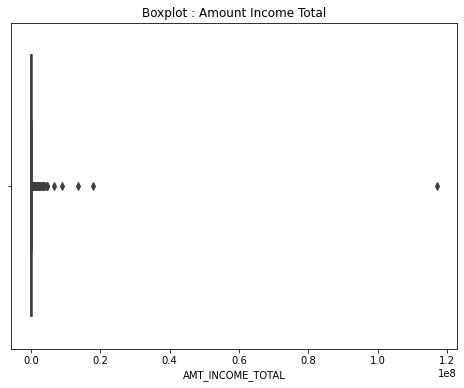

In [5]:
# Cek Outliers yang ada pada feature AMT_INCOME_TOTAL
plt.figure(figsize=(8,6))
plt.title('Boxplot : Amount Income Total')
sns.boxplot(df['AMT_INCOME_TOTAL'])
plt.show()

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


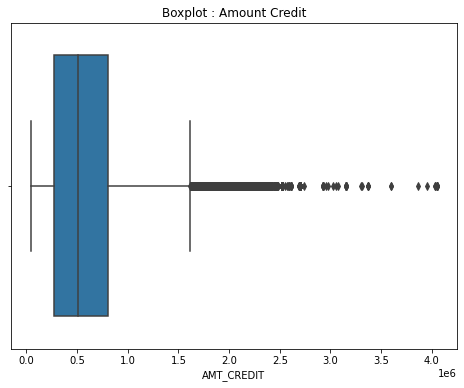

In [6]:
# Cek Outliers pada feature AMT_CREDIT
plt.figure(figsize=(8,6))
plt.title('Boxplot : Amount Credit')
sns.boxplot(df['AMT_CREDIT'])
plt.show()

Setelah diamati, ternyata data AMT_INCOME_TOTAL dan AMT_CREDIT memiliki banyak data outliers. Sehingga untuk mengetahui titik pusat datanya akan lebih tepat menggunakan median

Titik Pusat Data (Central Tendency)

In [7]:
# Penentuan titik pusat data untuk feature AMT_INCOME_TOTAL
ait = df['AMT_INCOME_TOTAL']
q1_ait = ait.quantile(0.25)
q2_ait = ait.quantile(0.5)
q3_ait = ait.quantile(0.75)
iqr_ait = q3_ait - q1_ait
lower_ait = q1_ait - 1.5*iqr_ait
upper_ait = q3_ait + 1.5*iqr_ait
print('Nilai bawah dari feature AMT_INCOME_TOTAL adalah', q1_ait)
print('Nilai tengah dari feature AMT_INCOME_TOTAL adalah', q2_ait)
print('Nilai atas dari feature AMT_INCOME_TOTAL adalah', q3_ait)
print('Batas bawah dari feature AMT_INCOME_TOTAL adalah', lower_ait)
print('Batas atas dari feature AMT_INCOME_TOTAL adalah', upper_ait)

Nilai bawah dari feature AMT_INCOME_TOTAL adalah 112500.0
Nilai tengah dari feature AMT_INCOME_TOTAL adalah 147150.0
Nilai atas dari feature AMT_INCOME_TOTAL adalah 202500.0
Batas bawah dari feature AMT_INCOME_TOTAL adalah -22500.0
Batas atas dari feature AMT_INCOME_TOTAL adalah 337500.0


In [8]:
# Penentuan titik pusat data untuk feature AMT_CREDIT
ac = df['AMT_CREDIT']
q1_ac = ac.quantile(0.25)
q2_ac = ac.quantile(0.5)
q3_ac = ac.quantile(0.75)
iqr_ac = q3_ac - q1_ac
lower_ac = q1_ac - 1.5*iqr_ac
upper_ac = q3_ac + 1.5*iqr_ac
print('Nilai bawah dari feature AMT_CREDIT adalah', q1_ac)
print('Nilai tengah dari feature AMT_CREDIT adalah', q2_ac)
print('Nilai atas dari feature AMT_CREDIT adalah', q3_ac)
print('Batas bawah dari feature AMT_CREDIT adalah', lower_ac)
print('Batas atas dari feature AMT_CREDIT adalah', upper_ac)

Nilai bawah dari feature AMT_CREDIT adalah 270000.0
Nilai tengah dari feature AMT_CREDIT adalah 513531.0
Nilai atas dari feature AMT_CREDIT adalah 808650.0
Batas bawah dari feature AMT_CREDIT adalah -537975.0
Batas atas dari feature AMT_CREDIT adalah 1616625.0


Persebaran Data (Dispersion)

In [9]:
stdev_ait = ait.std()
stdev_ac = ac.std()
mean_ait = ait.mean()
mean_ac = ac.mean()

print('Standard Deviation dari feature AMT_INCOME_TOTAL adalah', stdev_ait)
print('Standard Deviation dari feature AMT_CREDIT adalah', stdev_ac)
print('Nilai rata2 dari feature AMT_INCOME_TOTAL adalah', mean_ait)
print('Nilai rata2 dari feature AMT_CREDIT adalah', mean_ac)

Standard Deviation dari feature AMT_INCOME_TOTAL adalah 237123.14627885626
Standard Deviation dari feature AMT_CREDIT adalah 402490.77699585486
Nilai rata2 dari feature AMT_INCOME_TOTAL adalah 168797.9192969845
Nilai rata2 dari feature AMT_CREDIT adalah 599025.9997057016


Insight : Dapat kita lihat bahwa kedua data (income dan credit) sangat bervariasi. Hal tersebut dapat ditunjukkan dengan membandingkan nilai standar deviasinya terhadap nilai rata2 nya. Namun dapat kita simpulkan bahwa seseorang cendrung memiliki pinjaman(credit) yang lebih besar daripada pendapatanya(income). Seharusnya kita harus bijak ketika mengambil keputusan untuk mendapat pinjaman sebanding dengan pendapatan kita.

Distribusi Data (Distribution)

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


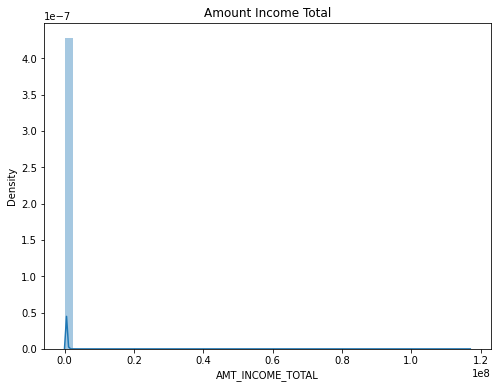

In [10]:
plt.figure(figsize=(8,6))
plt.title('Amount Income Total')
sns.distplot(ait)
plt.show()

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


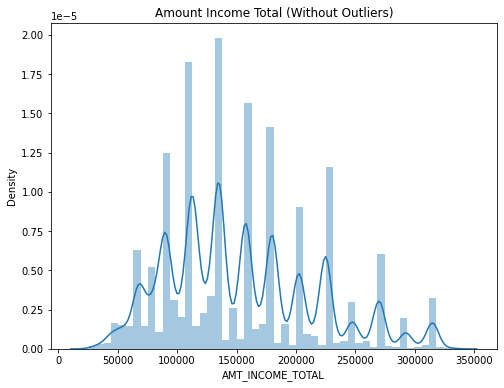

In [11]:
plt.figure(figsize=(8,6))
plt.title('Amount Income Total (Without Outliers)')
sns.distplot(ait[ait<upper_ait])
plt.show()

Dari data income total dapat kita lihat bahwa rata2 pendapatan seseorang berjenjang dari 50k - 350k, namun modus dari income dapat kita lihat berada disekitar 130k. Ketika kita melihat data secara keseluruhan, bahwa terjadi kesenjangan pendapatan, hal ini dibuktikan karena masih banyak orang yg pendapatanya lebih dari 350k bahkan hampir menyentuh angka 12*10^8 (1.2T)

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


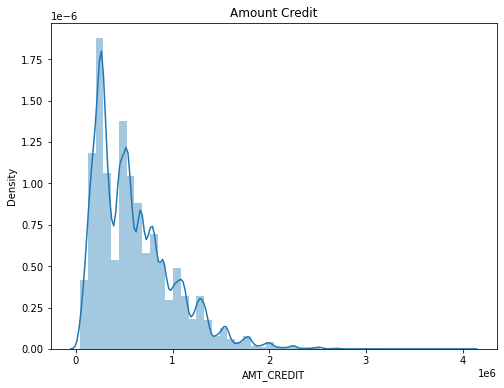

In [12]:
plt.figure(figsize=(8,6))
plt.title('Amount Credit')
sns.distplot(ac)
plt.show()

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


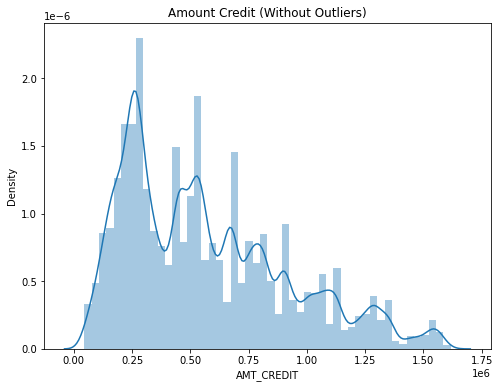

In [13]:
plt.figure(figsize=(8,6))
plt.title('Amount Credit (Without Outliers)')
sns.distplot(ac[ac<upper_ac])
plt.show()

Dapat kita lihat bahwa orang meminjam (credit) terbanyak sekitar 0.25*10^6 atau sekitar 250k. Dimana jika kita bandingkan dengan pemasukan (income) ternyata kebanyakan orang masih mengambil keputusan yang masuk akal karena mereka hanya berani meminjam dalam rentang income nya. Namun masih banyak juga yang meminjam diluar rata2 income bahkan hingga lebih dari 4M

Carilah data outlier dan beri penjelasan (insight) pada feature/column DAYS_EMPLOYED ! Tambahkan
plot untuk menampilkan adanya data outlier!

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


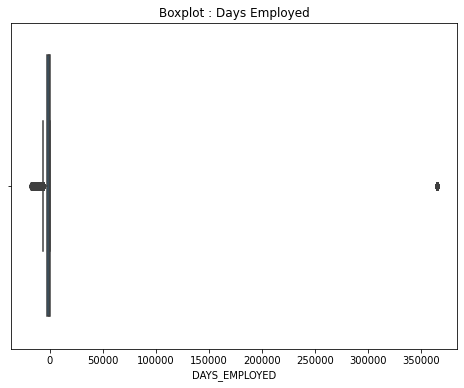

In [14]:
de = df['DAYS_EMPLOYED']
plt.figure(figsize=(8,6))
plt.title('Boxplot : Days Employed')
sns.boxplot(de)
plt.show()

In [15]:
# Penentuan titik pusat data untuk feature DAYS_EMPLOYED
q1_de = de.quantile(0.25)
q2_de = de.quantile(0.5)
q3_de = de.quantile(0.75)
iqr_de = q3_de - q1_de
lower_de = q1_de - 1.5*iqr_de
upper_de = q3_de + 1.5*iqr_de
max_de = de.max()
print('Nilai bawah dari feature Days_Employed adalah', q1_de)
print('Nilai tengah dari feature Days_Employed adalah', q2_de)
print('Nilai atas dari feature Days_Employed adalah', q3_de)
print('Batas bawah dari feature Days_Employed adalah', lower_de)
print('Batas atas dari feature Days_Employed adalah', upper_de)
print('Nilai tertinggi dari feature Days_Employed adalah', max_de)

Nilai bawah dari feature Days_Employed adalah -2760.0
Nilai tengah dari feature Days_Employed adalah -1213.0
Nilai atas dari feature Days_Employed adalah -289.0
Batas bawah dari feature Days_Employed adalah -6466.5
Batas atas dari feature Days_Employed adalah 3417.5
Nilai tertinggi dari feature Days_Employed adalah 365243


In [16]:
outliers_de = df[(de > upper_de) | (de < lower_de)]['DAYS_EMPLOYED']
outliers_de

8         365243
11        365243
18         -7804
23        365243
38        365243
           ...  
307502     -8736
307504     -7258
307505    365243
307507    365243
307508     -7921
Name: DAYS_EMPLOYED, Length: 72217, dtype: int64

Insight : Setelah diamati, mungkin terdapat kekeliruan dari data days_employed, karena ada data yang negatif dan juga data yang tidak masuk akal. Teramati karyawan terlama telah bekerja selama 365000 hari atau setara dengan 1000 tahun

3. Tampilkan distribusi (sebaran data) dalam bentuk plot yang tepat, untuk feature/column DAYS_BIRTH.
Jelaskan insight apa yang Anda dapatkan di setiap plot tersebut!

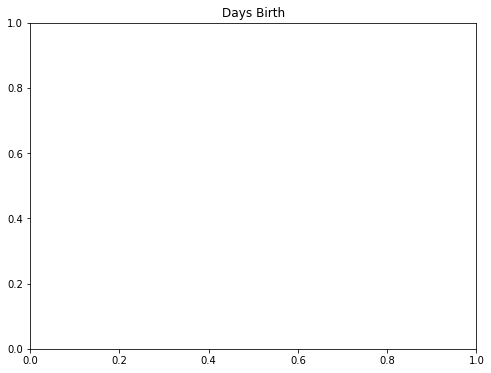

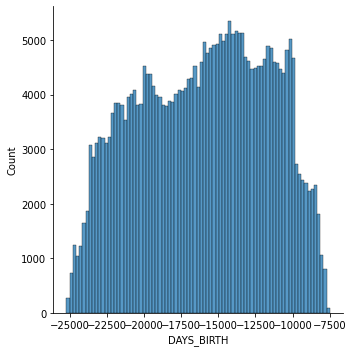

In [17]:
db = df['DAYS_BIRTH']
plt.figure(figsize=(8,6))
plt.title('Days Birth')
sns.displot(db)
plt.show()

In [18]:
mean_db = db.mean()
year_db = mean_db/-360
max_db = db.max()/-360
min_db = db.min()/-360
print('Rata2 umur peminjam', year_db)
print('Peminjam dengan umur paling muda', max_db)
print('Peminjam dengan umur paling tua', min_db)

Rata2 umur peminjam 44.54720851900871
Peminjam dengan umur paling muda 20.802777777777777
Peminjam dengan umur paling tua 70.08055555555555


Insight : Rata2 orang yang mengaplikasi untuk mengkredit rumah yaitu sekitar umur 44 tahun. Dengan aplikator termuda 20 tahun dan aplikator paling tua diusia 70 tahun.

4. Buatlah plot yang tepat mengenai kelompok umur yang gagal melakukan pembayaran. Untuk umur
bisa menggunakan variabel DAYS_BIRTH dan identifier apakah orang tersebut gagal melakukan
pembayaran adalah TARGET. Kelompok umur adalah tiap 5 tahun. Ex : 20-25 tahun, 26-30 tahun, etc.
Jelaskan (insight) dari plot yang Anda buat!

In [20]:
rangedf = df.groupby(pd.cut(db,np.arange(db.min(),db.max(),1825))).sum()
rangedf

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
DAYS_BIRTH,,,,,,,,,,,,,,,,,,,,,
"(-25229, -23404]",3517691348,540,125,1.607706e+09,4.920921e+09,2.624121e+08,4.424582e+09,275.125848,-304427545,4085405629,...,6,0,0,0,46.0,64.0,361.0,1689.0,3428.0,24428.0
"(-23404, -21579]",8017172993,1544,537,4.248196e+09,1.744688e+10,7.396696e+08,1.568787e+10,614.376186,-647104434,8091774487,...,86,5,2,0,167.0,175.0,892.0,5725.0,7054.0,53690.0
"(-21579, -19754]",9456270193,1925,1643,5.449920e+09,2.186745e+10,9.213277e+08,1.966083e+10,715.998076,-700105735,5886923998,...,176,17,11,1,174.0,207.0,1028.0,8313.0,8214.0,60191.0
"(-19754, -17929]",9480795728,2344,4362,5.886937e+09,2.237664e+10,9.664809e+08,2.008989e+10,726.778860,-643028177,1155805460,...,210,23,12,1,182.0,216.0,1069.0,8724.0,7798.0,57286.0
"(-17929, -16104]",10053869257,2738,12115,6.544292e+09,2.413754e+10,1.048689e+09,2.157711e+10,763.728215,-614499211,291785799,...,244,31,20,0,222.0,207.0,1076.0,9680.0,8017.0,59289.0
"(-16104, -14279]",11791541263,3325,27025,7.667456e+09,2.726843e+10,1.211808e+09,2.449978e+10,880.593647,-641334841,110584782,...,304,34,34,4,221.0,246.0,1258.0,10964.0,9842.0,70410.0
"(-14279, -12454]",11654245107,3883,36411,7.611151e+09,2.592718e+10,1.178177e+09,2.327276e+10,867.019472,-561230916,15764671,...,363,31,20,6,236.0,262.0,1256.0,10163.0,9694.0,66973.0
"(-12454, -10629]",10956477168,4138,30561,6.861054e+09,2.216489e+10,1.075243e+09,1.990392e+10,800.449505,-455603891,-15557440,...,467,25,25,1,216.0,255.0,1169.0,9958.0,8622.0,60939.0
"(-10629, -8804]",8202305026,3278,13797,4.794450e+09,1.460656e+10,7.489996e+08,1.314316e+10,594.630996,-291349327,-2491360,...,520,17,31,41,187.0,181.0,829.0,4976.0,6337.0,43149.0


In [21]:
sorted_rdf = rangedf.sort_values('FLAG_DOCUMENT_18',ascending=False)
sorted_rdf

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
DAYS_BIRTH,,,,,,,,,,,,,,,,,,,,,
"(-10629, -8804]",8202305026,3278,13797,4.794450e+09,1.460656e+10,7.489996e+08,1.314316e+10,594.630996,-291349327,-2491360,...,520,17,31,41,187.0,181.0,829.0,4976.0,6337.0,43149.0
"(-12454, -10629]",10956477168,4138,30561,6.861054e+09,2.216489e+10,1.075243e+09,1.990392e+10,800.449505,-455603891,-15557440,...,467,25,25,1,216.0,255.0,1169.0,9958.0,8622.0,60939.0
"(-14279, -12454]",11654245107,3883,36411,7.611151e+09,2.592718e+10,1.178177e+09,2.327276e+10,867.019472,-561230916,15764671,...,363,31,20,6,236.0,262.0,1256.0,10163.0,9694.0,66973.0
"(-16104, -14279]",11791541263,3325,27025,7.667456e+09,2.726843e+10,1.211808e+09,2.449978e+10,880.593647,-641334841,110584782,...,304,34,34,4,221.0,246.0,1258.0,10964.0,9842.0,70410.0
"(-17929, -16104]",10053869257,2738,12115,6.544292e+09,2.413754e+10,1.048689e+09,2.157711e+10,763.728215,-614499211,291785799,...,244,31,20,0,222.0,207.0,1076.0,9680.0,8017.0,59289.0
"(-19754, -17929]",9480795728,2344,4362,5.886937e+09,2.237664e+10,9.664809e+08,2.008989e+10,726.778860,-643028177,1155805460,...,210,23,12,1,182.0,216.0,1069.0,8724.0,7798.0,57286.0
"(-21579, -19754]",9456270193,1925,1643,5.449920e+09,2.186745e+10,9.213277e+08,1.966083e+10,715.998076,-700105735,5886923998,...,176,17,11,1,174.0,207.0,1028.0,8313.0,8214.0,60191.0
"(-23404, -21579]",8017172993,1544,537,4.248196e+09,1.744688e+10,7.396696e+08,1.568787e+10,614.376186,-647104434,8091774487,...,86,5,2,0,167.0,175.0,892.0,5725.0,7054.0,53690.0
"(-25229, -23404]",3517691348,540,125,1.607706e+09,4.920921e+09,2.624121e+08,4.424582e+09,275.125848,-304427545,4085405629,...,6,0,0,0,46.0,64.0,361.0,1689.0,3428.0,24428.0


In [22]:
final_rdf = sorted_rdf.set_axis(['25 down','26-30','31-35','36-40','41-45','46-50','51-55','56-60','61 up'],axis='index')
final_rdf

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
25 down,8202305026,3278,13797,4.794450e+09,1.460656e+10,7.489996e+08,1.314316e+10,594.630996,-291349327,-2491360,...,520,17,31,41,187.0,181.0,829.0,4976.0,6337.0,43149.0
26-30,10956477168,4138,30561,6.861054e+09,2.216489e+10,1.075243e+09,1.990392e+10,800.449505,-455603891,-15557440,...,467,25,25,1,216.0,255.0,1169.0,9958.0,8622.0,60939.0
31-35,11654245107,3883,36411,7.611151e+09,2.592718e+10,1.178177e+09,2.327276e+10,867.019472,-561230916,15764671,...,363,31,20,6,236.0,262.0,1256.0,10163.0,9694.0,66973.0
36-40,11791541263,3325,27025,7.667456e+09,2.726843e+10,1.211808e+09,2.449978e+10,880.593647,-641334841,110584782,...,304,34,34,4,221.0,246.0,1258.0,10964.0,9842.0,70410.0
41-45,10053869257,2738,12115,6.544292e+09,2.413754e+10,1.048689e+09,2.157711e+10,763.728215,-614499211,291785799,...,244,31,20,0,222.0,207.0,1076.0,9680.0,8017.0,59289.0
46-50,9480795728,2344,4362,5.886937e+09,2.237664e+10,9.664809e+08,2.008989e+10,726.778860,-643028177,1155805460,...,210,23,12,1,182.0,216.0,1069.0,8724.0,7798.0,57286.0
51-55,9456270193,1925,1643,5.449920e+09,2.186745e+10,9.213277e+08,1.966083e+10,715.998076,-700105735,5886923998,...,176,17,11,1,174.0,207.0,1028.0,8313.0,8214.0,60191.0
56-60,8017172993,1544,537,4.248196e+09,1.744688e+10,7.396696e+08,1.568787e+10,614.376186,-647104434,8091774487,...,86,5,2,0,167.0,175.0,892.0,5725.0,7054.0,53690.0
61 up,3517691348,540,125,1.607706e+09,4.920921e+09,2.624121e+08,4.424582e+09,275.125848,-304427545,4085405629,...,6,0,0,0,46.0,64.0,361.0,1689.0,3428.0,24428.0


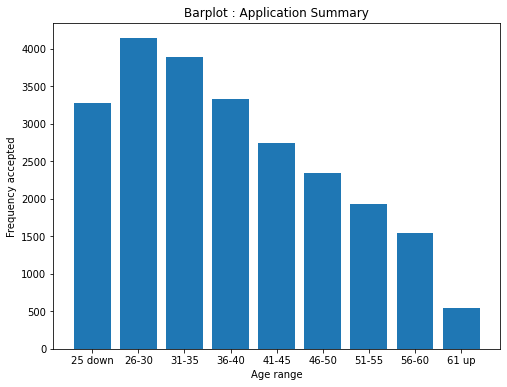

In [23]:
x = final_rdf.index.unique().tolist()
y = sorted_rdf['TARGET']
plt.figure(figsize=(8,6))
plt.title('Barplot : Application Summary')
plt.bar(x,y)
plt.xlabel('Age range')
plt.ylabel('Frequency accepted')
plt.show()

Insight : Setelah diamati, bank cendrung meluluskan aplikasi dari orang yang memilii rentang umur 26-30. Dapat kita simpulkan bahwa pada rentang umur 26 - 30 bahkan hingga 35 tahun. merupakan umur dimana seseorang sedang semangat bekerja dan masih terbilang muda. Oleh karena itu, bank akan memiliki resiko lebih kecil kehilangan uang (faktor phk maupun kematian) daripada meluluskan pinjaman kepada orang yang berumur 61 tahun keatas.

5. Di antara NAME_INCOME_TYPE, DAYS_BIRTH, & REGION_RATING_CLIENT_W_CITY, manakah
feature/column yang memiliki nilai korelasi tertinggi pada feature/column TARGET? Jelaskan metode korelasi apa yang Anda gunakan, serta apa insight untuk perusahaan setelah mengetahui nilai korelasi
tersebut?

In [24]:
df_corr = df[['NAME_INCOME_TYPE','DAYS_BIRTH','REGION_RATING_CLIENT_W_CITY','TARGET']]
df_corr

,NAME_INCOME_TYPE,DAYS_BIRTH,REGION_RATING_CLIENT_W_CITY,TARGET
0,Working,-9461,2,1
1,State servant,-16765,1,0
2,Working,-19046,2,0
3,Working,-19005,2,0
4,Working,-19932,2,0
...,...,...,...,...
307506,Working,-9327,1,0
307507,Pensioner,-20775,2,0
307508,Working,-14966,3,0
307509,Commercial associate,-11961,2,1


In [28]:
count_type = df.groupby('NAME_INCOME_TYPE').count()
count_type

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
NAME_INCOME_TYPE,,,,,,,,,,,,,,,,,,,,,
Businessman,10,10,10,10,10,10,10,10,10,10,...,10,10,10,10,4,4,4,4,4,4
Commercial associate,71617,71617,71617,71617,71617,71617,71617,71617,71617,71614,...,71617,71617,71617,71617,61806,61806,61806,61806,61806,61806
Maternity leave,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,1,1,1,1,1,1
Pensioner,55362,55362,55362,55362,55362,55362,55362,55362,55362,55362,...,55362,55362,55362,55362,47715,47715,47715,47715,47715,47715
State servant,21703,21703,21703,21703,21703,21703,21703,21703,21703,21700,...,21703,21703,21703,21703,19499,19499,19499,19499,19499,19499
Student,18,18,18,18,18,18,18,18,18,18,...,18,18,18,18,15,15,15,15,15,15
Unemployed,22,22,22,22,22,22,22,22,22,22,...,22,22,22,22,5,5,5,5,5,5
Working,158774,158774,158774,158774,158774,158774,158774,158774,158774,158768,...,158774,158774,158774,158774,136947,136947,136947,136947,136947,136947


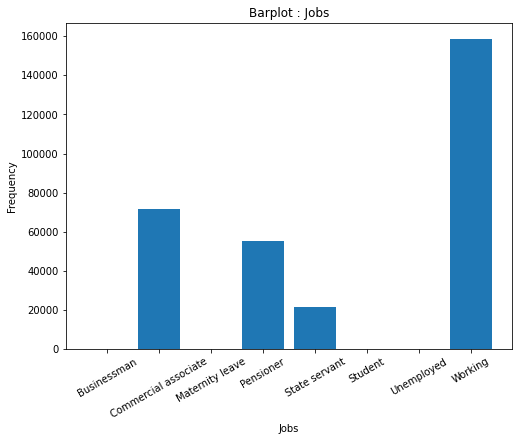

In [32]:
x = count_type.index.unique().tolist()
y = count_type['TARGET']
plt.figure(figsize=(8,6))
plt.title('Barplot : Jobs')
plt.bar(x,y)
plt.xlabel('Jobs')
plt.ylabel('Frequency')
plt.xticks(rotation=30)
plt.show()

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


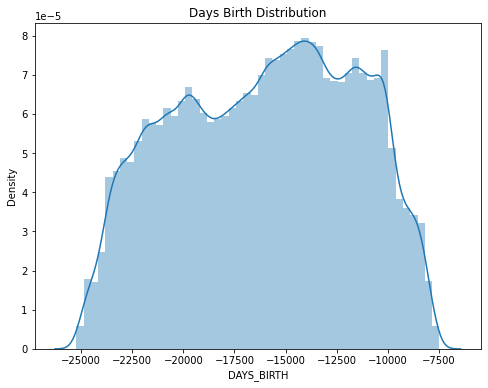

In [44]:
plt.figure(figsize=(8,6))
plt.title('Days Birth Distribution')
sns.distplot(db)
plt.show()

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


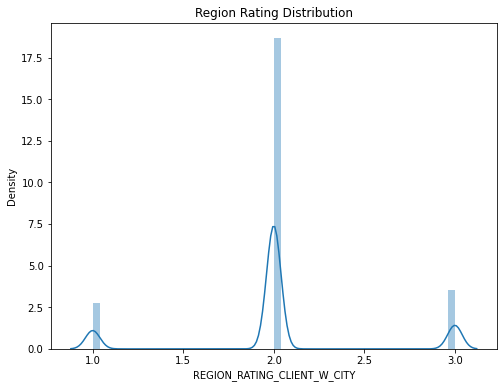

In [45]:
plt.figure(figsize=(8,6))
plt.title('Region Rating Distribution')
sns.distplot(df['REGION_RATING_CLIENT_W_CITY'])
plt.show()

C:\Users\Rafif Hendrawan\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


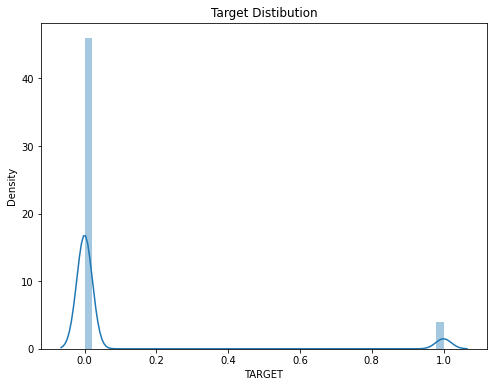

In [46]:
plt.figure(figsize=(8,6))
plt.title('Target Distibution')
sns.distplot(df['TARGET'])
plt.show()

Insight : Setelah mengamati data diatas, data Name_Income_Type merupakan data object oleh karena itu tidak bisa dibuat distribusi plot. Sedangkan ketiga data lainya bisa dibuat distribusi plotnya. Terlihat bahwa umur (days birth) dan region rating datanya berdistribusi normal. Namun target distribution tidak berdistribusi normal. 2 dari 3 data yang bisa diliat distribusinya merupakan data yg berdistribusi normal. Oleh karena itu, korelasi pearson lebih tepat untuk digunakan terhadap data yg berdistribusi normal.

In [47]:
corr = df_corr.corr(method='pearson')
corr

,DAYS_BIRTH,REGION_RATING_CLIENT_W_CITY,TARGET
DAYS_BIRTH,1.000000,0.008073,0.078239
REGION_RATING_CLIENT_W_CITY,0.008073,1.000000,0.060893
TARGET,0.078239,0.060893,1.000000


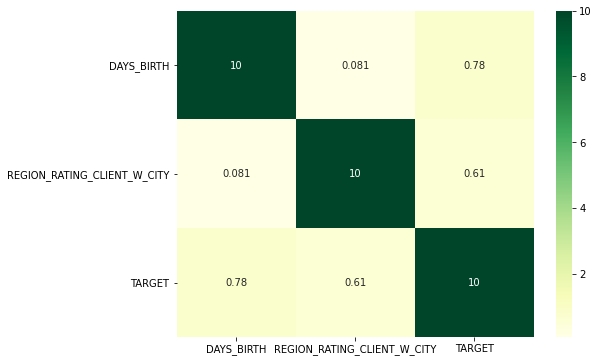

In [51]:
plt.figure(figsize=(8,6))
sns.heatmap(corr*10, cmap="YlGn",annot=True)
plt.show()

Insight : Dilihat dari grafik diatas, feature usia paling berkorelasi dengan kelulusan pinjaman kredit. Seperti sudah dideskripsikan sebelumnya. Faktor usia berpengaruh dengan kemungkinan phk dan kematian yang rendah yang mengakibatkan tingkat kelulusan kredit pinjaman semakin tinggi.

6. Temukan NAME_INCOME_TYPE yang rata-rata income (AMT_INCOME_TOTAL) paling tinggi, serta
tampilkan NAME_INCOME_TYPE dan rata-rata salary dalam bentuk Barplot! Lalu carilah:

- Tiga NAME_EDUCATION_TYPE yang memiliki rata-rata salary tertinggi!
- Lima tipe pekerjaan (OCCUPATION_TYPE) yang memiliki rata-rata salary tertinggi!
- Tiga status perkawinan (NAME_FAMILY_STATUS) yang paling sering dilakukan!

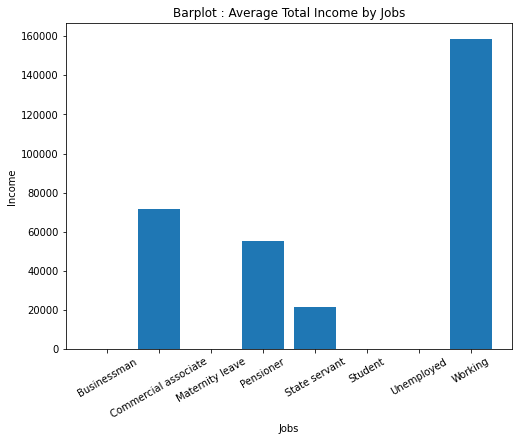

In [63]:
# Pekerjaan yang memiliki salary rata2 paling tinggi
x = count_type.index.unique().tolist()
y = count_type['AMT_INCOME_TOTAL']
plt.figure(figsize=(8,6))
plt.title('Barplot : Average Total Income by Jobs')
plt.bar(x,y)
plt.xlabel('Jobs')
plt.ylabel('Income')
plt.xticks(rotation=30)
plt.show()

In [70]:
edu_salary = df.groupby('NAME_EDUCATION_TYPE').mean()['AMT_INCOME_TOTAL']
sorted_edu = edu_salary.sort_values(ascending=False)
top_edu = sorted_edu.head(3)
top_edu


NAME_EDUCATION_TYPE
Academic degree      240009.146341
Higher education     208652.053814
Incomplete higher    181563.812397
Name: AMT_INCOME_TOTAL, dtype: float64

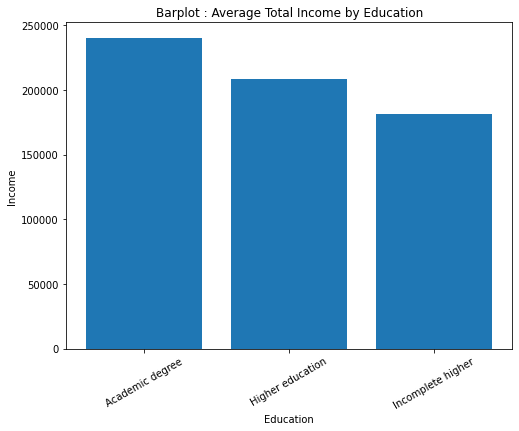

In [71]:
# 3 Education Type yang memiliki salary rata2 paling tinggi
x = top_edu.index.unique().tolist()
y = top_edu
plt.figure(figsize=(8,6))
plt.title('Barplot : Average Total Income by Education')
plt.bar(x,y)
plt.xlabel('Education')
plt.ylabel('Income')
plt.xticks(rotation=30)
plt.show()

In [72]:
occ_salary = df.groupby('OCCUPATION_TYPE').mean()['AMT_INCOME_TOTAL']
sorted_occ = occ_salary.sort_values(ascending=False)
top_occ = sorted_edu.head(5)
top_occ

NAME_EDUCATION_TYPE
Academic degree                  240009.146341
Higher education                 208652.053814
Incomplete higher                181563.812397
Secondary / secondary special    155158.512138
Lower secondary                  130079.358491
Name: AMT_INCOME_TOTAL, dtype: float64

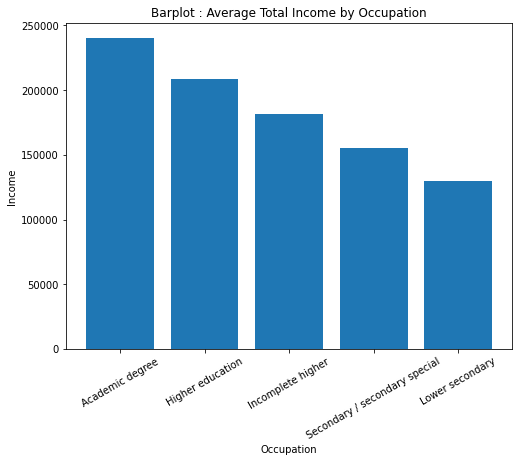

In [73]:
# 5 Occupation Type yang memiliki salary rata2 paling tinggi
x = top_occ.index.unique().tolist()
y = top_occ
plt.figure(figsize=(8,6))
plt.title('Barplot : Average Total Income by Occupation')
plt.bar(x,y)
plt.xlabel('Occupation')
plt.ylabel('Income')
plt.xticks(rotation=30)
plt.show()

In [76]:
status = df.groupby('NAME_FAMILY_STATUS').count()['TARGET']
sorted_status = status.sort_values(ascending=False)
top_status = sorted_status.head()
top_status

NAME_FAMILY_STATUS
Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Name: TARGET, dtype: int64

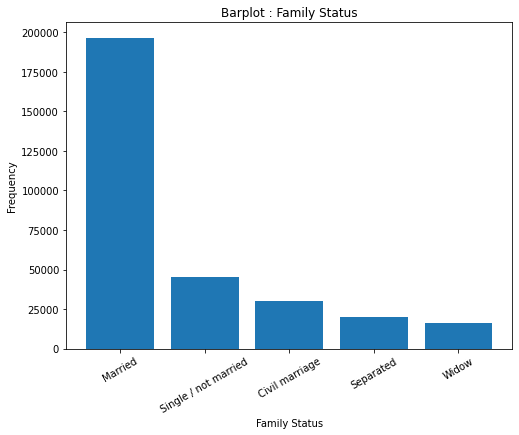

In [77]:
# 5 Family Status yang paling banyak terjadi
x = top_status.index.unique().tolist()
y = top_status
plt.figure(figsize=(8,6))
plt.title('Barplot : Family Status')
plt.bar(x,y)
plt.xlabel('Family Status')
plt.ylabel('Frequency')
plt.xticks(rotation=30)
plt.show()